## Chapter 9
# Sound Synthesis

### Constructing a Simple Synthesis Instrument

In [1]:
import sys
sys.path.append('../')

import numpy as np
import matplotlib.pyplot as plt

from NoteSequence import render_samples_ipython
from conversion import SAMPLES_PER_SECOND

def samps(seconds):
    return int(SAMPLES_PER_SECOND * seconds)

def seconds(samples):
    return samples / SAMPLES_PER_SECOND

#### Simple Sine Wave Generator

In [2]:
def sine_wave(amplitude=1, frequency=440, t=0):
    return amplitude * np.sin(2 * np.pi * frequency * seconds(t))

#### Simple Envelope Generator

In [3]:
def env(attack_time_samples=4000, attack_steepness=2, decay_time_samples=4000, decay_steepness=1.5, t=0):
    if t < attack_time_samples:
        return (t / attack_time_samples) ** (1 / attack_steepness)
    elif attack_time_samples <= t and t < attack_time_samples + decay_time_samples:
        return 1 - ((t - attack_time_samples) / decay_time_samples) ** (1 / decay_steepness)
    else:
        return 0

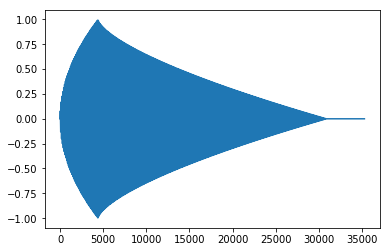

In [4]:
tone = [sine_wave(env(samps(0.1), 2, samps(0.6), 1.5, t=t), t=t) for t in range(samps(0.8))]
_ = plt.plot(tone)

In [5]:
render_samples_ipython(tone)

#### Adding Vibrato

In [6]:
tone = [sine_wave(env(samps(0.1), 2, samps(2), 1.5, t=t), 440 + sine_wave(1, 6, t=t), t=t) for t in range(samps(3))]
render_samples_ipython(tone)

_(Note that the vibrato above increases in magnitude over time. This is because the time ticks forward and the calculation of each sine sample assumes the frequency has been constant over that full duration. We could improve by taking this into account.)_

### Geometric Waveforms

#### Square Waves

If we only sum odd-numbered sine-phase harmonics and arrange their ampliltudes to be odd reciprocals,

$f(t) = \sum_\limits{k=0}^\limits{N-1}{\frac{1}{2k + 1}\sin{[2\pi(2k + 1) \dot t]}}, N > 0$,

then the series converges as $N \to \infty$ to a _square wave_.

In [7]:
def square_wave_approx(N, frequency, duration_sec):
    t_range = np.linspace(0, duration_sec, samps(duration_sec))
    return np.sum([(1/k) * np.sin(2 * np.pi * frequency * k * t_range) for k in range(1, 2 * N + 1, 2)], axis=0)

In [8]:
from ipython_animation import create_animation

fig = plt.figure(figsize=(10, 6))
ax, = plt.plot(square_wave_approx(1, 4, 1))
plt.ylim(-1.1, 1.1)
def animate_square_wave_approx(frame):
    ax.set_ydata(square_wave_approx(frame + 1, 4, 1))
    plt.title('Approximation of square wave with %i summed odd-harmonics' % (frame + 1))

create_animation(fig, plt, animate_square_wave_approx, length_seconds=3, frames_per_second=12)

Note the slight overshoot and rigning at the ends of the vertical excursion of the waveforms. This effect is called the _Gibbs phenomenon_ (or _Gibbs' horns_).  The Fourier series functions only approximate the discontinuous points of the non-band-limited square wave function.

In [9]:
from scipy.signal import square

def square_wave(amplitude=1, frequency=440, t=0):
    return amplitude * square(2 * np.pi * frequency * seconds(t))

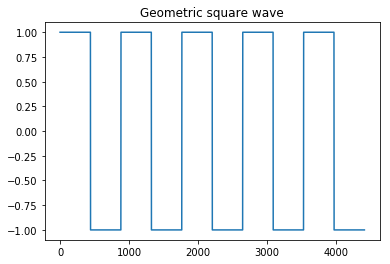

In [10]:
square_tone = [square_wave(frequency=50, t=t) for t in range(samps(0.1))]
plt.plot(square_tone)
_ = plt.title('Geometric square wave')

Compare the sound of the non-band-limited square wave ...

In [11]:
render_samples_ipython([square_wave(env(decay_time_samples=samps(2), t=t), frequency=220, t=t) for t in range(samps(2.2))])

with a square wave estimated with 20 odd-harmonic sinusoids:

In [12]:
swa = square_wave_approx(20, frequency=220, duration_sec=2.2)
render_samples_ipython(np.array([env(decay_time_samples=samps(2), t=t) for t in range(len(swa))]) * swa)

#### Triangular Waves

By summing odd-numbered cosine harmonics and making their amplitudes squared odd reciprocals, the series converges to a _triangular wave_ as $N \to \infty$:

$f(t) = \sum_\limits{k=0}^\limits{N-1}{\frac{1}{(2k+1)^2}\cos{[2\pi(2k+1\cdot t)]}}, N > 0$

In [13]:
def triangle_wave_approx(N, frequency, duration_sec):
    t_range = np.linspace(0, duration_sec, samps(duration_sec))
    return np.sum([(k ** -2) * np.cos(2 * np.pi * frequency * k * t_range) for k in range(1, 2 * N + 1, 2)], axis=0)

In [14]:
fig = plt.figure(figsize=(10, 6))
ax, = plt.plot(triangle_wave_approx(1, 4, 1))
plt.ylim(-1.5, 1.5)
def animate_triangle_wave_approx(frame):
    ax.set_ydata(triangle_wave_approx(frame + 1, 4, 1))
    plt.title('Approximation of triangle wave with %i summed odd-harmonics' % (frame + 1))

create_animation(fig, plt, animate_triangle_wave_approx, length_seconds=3, frames_per_second=4)

In [15]:
twa = triangle_wave_approx(10, frequency=220, duration_sec=2.2)
render_samples_ipython(np.array([env(decay_time_samples=samps(2), t=t) for t in range(len(twa))]) * twa)

#### Sawtooth Waves

The sawtooth wave is created by summing all odd harmonics and subtracting all even harmonics, with amplitudes as the reciprocal of the harmonic number:

$y(t) = \sum_\limits{k=1}^\limits{N}{\frac{(-1)^{k+1}}{k}\sin{2\pi kt}}, N > 0$.

In [16]:
def sawtooth_wave_approx(N, frequency, duration_sec):
    t_range = np.linspace(0, duration_sec, samps(duration_sec))
    return np.sum([((-1 ** (k + 1)) / k) * np.sin(2 * np.pi * frequency * k * t_range) for k in range(1, N + 1)], axis=0)

In [17]:
fig = plt.figure(figsize=(10, 6))
ax, = plt.plot(sawtooth_wave_approx(1, 4, 1))
plt.ylim(-2, 2)
def animate_sawtooth_wave_approx(frame):
    ax.set_ydata(sawtooth_wave_approx(frame + 1, 4, 1))
    plt.title('Approximation of sawtooth wave with %i summed harmonics' % (frame + 1))

create_animation(fig, plt, animate_sawtooth_wave_approx, length_seconds=3)

In [18]:
stwa = sawtooth_wave_approx(50, frequency=220, duration_sec=2.2)
render_samples_ipython(np.array([env(decay_time_samples=samps(2), t=t) for t in range(len(stwa))]) * stwa)

#### Sum of Cosine Waves

Summing equal-amplitude cosine harmonics,

$f(t) = \frac{1}{N}\sum_\limits{k=1}^\limits{N}{\cos{2\pi kt}}, N > 0$,

the series converges as $N \to \infty$ to an impulse train signal.

In [19]:
def sum_of_cosines(N, frequency, duration_sec):
    t_range = np.linspace(0, duration_sec, samps(duration_sec))
    return (1/N) * np.sum([np.cos(2 * np.pi * frequency * k * t_range) for k in range(1, N + 1)], axis=0)

In [20]:
fig = plt.figure(figsize=(10, 6))
ax, = plt.plot(sum_of_cosines(1, 4, 1))
plt.ylim(-2, 2)
def animate_sum_of_cosines(frame):
    ax.set_ydata(sum_of_cosines(frame + 1, 4, 1))
    plt.title('Approximation of impulse train signal with %i summed cosines' % (frame + 1))

create_animation(fig, plt, animate_sum_of_cosines, length_seconds=4)

In [21]:
impulse_train = sum_of_cosines(70, frequency=110, duration_sec=2.2)
render_samples_ipython(np.array([env(decay_time_samples=samps(2), t=t) for t in range(len(impulse_train))]) * impulse_train)

## Wavetable Synthesis

We can drastically reduce the amount of computation required to generate a periodic signal by precomputing one period and storing it in a table. We then iteratively read out the precomputed sample values from the table in real time to generate the sound.

To capture just one period of the waveform, use

$\tau_s = \sum_\limits{n=1}^\limits{N}{A_n\sin{2\pi n \frac{s}{L}}}$,

where $\tau_s$ represents a table of length $L$, indexed by $s$, holding one period of the sampled waveform.

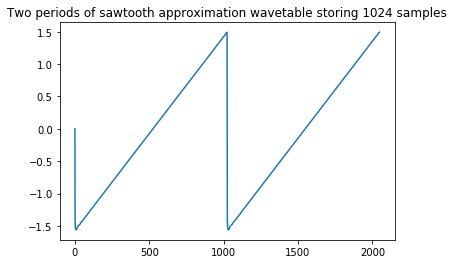

In [22]:
sawtooth_wavetable = sawtooth_wave_approx(1000, SAMPLES_PER_SECOND // 1024 - 1, seconds(1024))
plt.plot(np.hstack([sawtooth_wavetable, sawtooth_wavetable]))
_ = plt.title('Two periods of sawtooth approximation wavetable storing %i samples' % len(sawtooth_wavetable))

### Indexing a Wavetable

If we increment $s$ by an amount $\Delta s$, the effective frequency will be

$f = \Delta s\frac{R}{L}$,

for some sample rate $R$ and table length $L$.

For example, if we double $\Delta s$ to $2$, we will cycle through the table twice as fast and the frequency will be

$f = 2 * 44100 / 1024 \approx 86 Hz$.

In [23]:
# `s_deltas` can be a single number or array of numbers (ints or floats)
# The deltas will be tiled such that `SAMPLE_RATE * duration_seconds` samples are returned.
# The final computed indexes are truncated to integers.
def sample_wavetable_truncate_indices(wavetable, s_deltas, duration_seconds=1):
    total_samps = samps(duration_seconds)
    s_deltas = np.asarray(s_deltas)
    if s_deltas.size < total_samps:
        s_deltas = np.tile(s_deltas, total_samps // s_deltas.size)
    return wavetable[s_deltas.cumsum().astype('int') % wavetable.size]

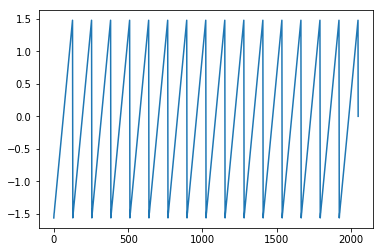

In [24]:
_ = plt.plot(sample_wavetable_truncate_indices(sawtooth_wavetable, 8)[:2048])

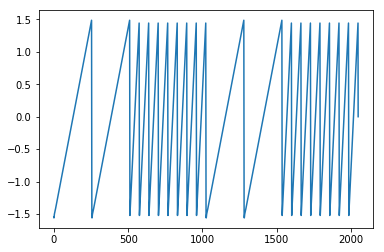

In [25]:
_ = plt.plot(sample_wavetable_truncate_indices(sawtooth_wavetable, np.hstack([[4] * 512, [16] * 512]))[:2048])

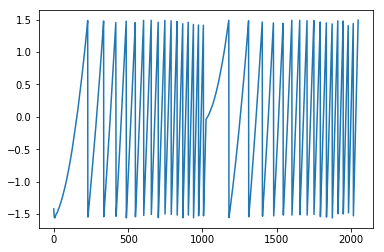

In [26]:
_ = plt.plot(sample_wavetable_truncate_indices(sawtooth_wavetable, np.linspace(1, 32, 1024))[:2048])

Let's listen to a few examples of rising frequency with this sawtooth wave and truncated indexing.  Notice the increasing persistence artifacts as the frequency increases, until it becomes noise at the extremes when the indices start wrapping around many times for each sample.

In [27]:
chirps = [render_samples_ipython(sample_wavetable_truncate_indices(sawtooth_wavetable, np.linspace(0, final_s_delta, samps(4)), 4)) for final_s_delta in [10, 100, 1000, 100000, 100000000]]

In [28]:
chirps[0]

In [29]:
chirps[1]

In [30]:
chirps[2]

In [31]:
chirps[3]

In [32]:
chirps[4]

### Linear interpolation

In [33]:
# `s_deltas` can be a single number or array of numbers (ints or floats)
# The deltas will be tiled such that `SAMPLE_RATE * duration_seconds` samples are returned.
# The final computed values are linearly interpolated.
def sample_wavetable_interpolate_indices(wavetable, s_deltas, duration_seconds=1):
    total_samps = samps(duration_seconds)
    s_deltas = np.asarray(s_deltas)
    if s_deltas.size < total_samps:
        s_deltas = np.tile(s_deltas, total_samps // s_deltas.size)
    float_indices = s_deltas.cumsum() % wavetable.size
    result = np.ndarray(float_indices.size)
    for i in range(result.size):
        remainder = float_indices[i] - int(float_indices[i])
        result[i] = remainder * wavetable[(int(float_indices[i]) + 1) % wavetable.size] + (1 - remainder) * wavetable[int(float_indices[i])]
    return result

In [34]:
chirps = [render_samples_ipython(sample_wavetable_interpolate_indices(sawtooth_wavetable, np.linspace(0, final_s_delta, samps(4)), 4)) for final_s_delta in [10, 100, 1000, 100000, 100000000]]

The sawtooth wave isn't the best example of the difference linear interpolation can make on the sound, but let's listen to a couple:

In [35]:
render_samples_ipython(sample_wavetable_interpolate_indices(sawtooth_wavetable, np.linspace(0, 10, samps(4)), 4))

In [36]:
render_samples_ipython(sample_wavetable_interpolate_indices(sawtooth_wavetable, np.linspace(0, 100, samps(4)), 4))

The effect is obvious when a small section is plotted.

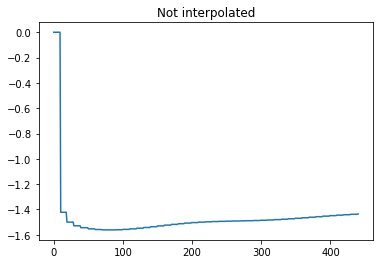

In [37]:
plt.plot(sample_wavetable_truncate_indices(sawtooth_wavetable, 0.1, duration_seconds=0.01))
_ = plt.title('Not interpolated')

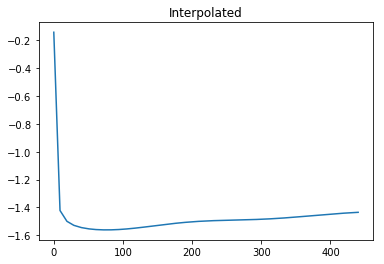

In [38]:
plt.plot(sample_wavetable_interpolate_indices(sawtooth_wavetable, 0.1, duration_seconds=0.01))
_ = plt.title('Interpolated')

## Amplidute Modulation

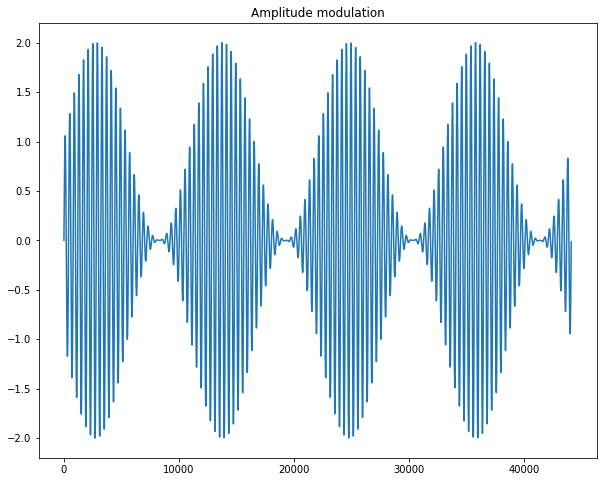

In [39]:
tone = [sine_wave(1 + sine_wave(1, 4, t=t), 110, t=t) for t in range(samps(1))]
plt.figure(figsize=(10, 8))
plt.plot(tone)
_ = plt.title('Amplitude modulation')

In [40]:
render_samples_ipython(tone)

In [41]:
# sweeping modulator frequency:
render_samples_ipython([sine_wave(1 + sine_wave(1, t/200, t=t), 220, t=t) for t in range(samps(4))])

## Ring Modulation

Ring modulations is the same as amplitude modulation but without adding 1 to the modulator to force it to be positive.

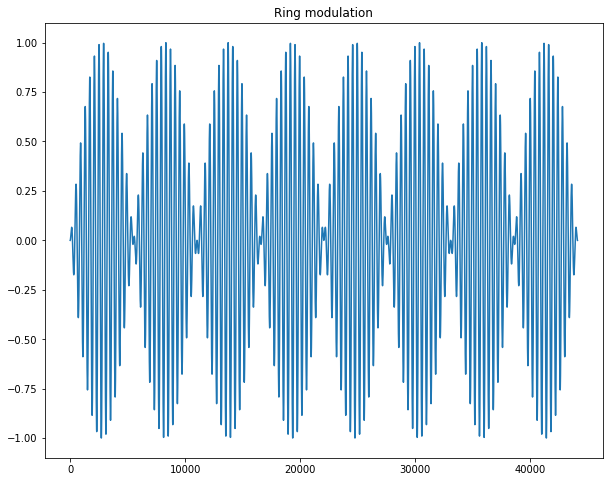

In [42]:
tone = [sine_wave(sine_wave(1, 4, t=t), 110, t=t) for t in range(samps(1))]
plt.figure(figsize=(10, 8))
plt.plot(tone)
_ = plt.title('Ring modulation')

In [43]:
render_samples_ipython(tone)

The carrier frequency is no longer present in the output spectrum. This can be audibly verified by listening to a frequency sweep of the modulator as we did with the AM example:

In [44]:
render_samples_ipython([sine_wave(sine_wave(1, t/200, t=t), 220, t=t) for t in range(samps(4))])

## Frequency Modulation

Frequency modulation can be defined mathematically as

$f(t) = A\sin(\omega_c t+ \Delta f \sin{\omega_m t})$,

where $A$ is amplitude, $\omega_c = 2\pi f_c$ is the carrier frequency, and $\omega_m = 2\pi f_m$ is the modulating frequency. The term $\Delta f$, called _peak frequency deviation_, determines the amplitude of the modulating oscillator's output, which controls the swing of the carrier oscillator's frequency.

The following animation is a reproduction of the series of plots in _Figure 9.29_ on _p390_.

In the book, the author notes that as $\Delta f$ grows, the carrier frequency declines in amplitude, and additional sidebands at fixed frequencies $f_c \pm nf_m$ enter the spectrum, where $n$ is the integer order of the sidebands.  However, when $\Delta f \approx 3.6$, the carrier frequency makes a reappearance.

The animation corroborates this observation.

In [45]:
t_range = np.arange(0, 1000)
carrier_frequency = 1000
modulator_frequency = 100

fig = plt.figure(figsize=(10, 6))
signal_plot = plt.subplot(211)
signal_ax, = signal_plot.plot(t_range)
signal_plot.set_ylim(-1.1, 1.1)
signal_plot.set_title('Frequency Modulation')

spectrum_plot = plt.subplot(212)
spectrum_ax, = spectrum_plot.plot(np.fft.rfftfreq(t_range.size, d=1./SAMPLES_PER_SECOND), t_range[:501], c='red')
spectrum_plot.set_xlim(0, 2000)
spectrum_plot.set_ylim(0, 1.1)
spectrum_plot.set_xlabel('Frequency (Hz)')
spectrum_plot.set_ylabel('Magnitude')
spectrum_plot.set_title('FM Spectrum')

def animate_fm(frame):
    peak_frequency_deviation = frame / 24
    tone = np.sin(2 * np.pi * carrier_frequency * t_range / SAMPLES_PER_SECOND + peak_frequency_deviation * np.sin(2 * np.pi * modulator_frequency * t_range / SAMPLES_PER_SECOND))
    signal_ax.set_ydata(tone)
    signal_plot.set_title('Frequency Modulation\nwith $f_c = %i$, $f_m = %i$, $\\Delta f = %f$' % (carrier_frequency, modulator_frequency, peak_frequency_deviation))
    spectrum = 2 * np.abs(np.fft.rfft(tone)) / tone.size
    spectrum_ax.set_data(np.fft.rfftfreq(tone.size, d=1./SAMPLES_PER_SECOND), spectrum)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
create_animation(fig, plt, animate_fm, length_seconds=5)

Let's hear what this sounds like:

In [46]:
t_range = np.linspace(0, 5, samps(5))
peak_frequency_deviation_range = np.linspace(0, 5, samps(5))
tone = np.sin(2 * np.pi * carrier_frequency * t_range + peak_frequency_deviation_range * np.sin(2 * np.pi * modulator_frequency * t_range))

In [47]:
tone[:samps(0.4)] *= np.linspace(0, 1, samps(0.4)) # remove start click
render_samples_ipython(tone)

The amplitudes of the sideband frequencies in FM synthesis are determined by _Bessel functions_, which also happen to determine the vibration patterns of membranes like drum heads, as explored in [chapter 8 of Volume 1](http://localhost:8888/notebooks/musimathics/volume_1/chapter_8_vibrating_systems.ipynb).

## Waveshaping

Rather than interpreting $\sin \omega t$ as a linear ramp function with $\omega t$ used to index a sine function, we can flip this perspective and use a sine function to index a ramp function:

$s(t) = W(\sin \omega t)$,

where $W$ is the waveshaping function.

If we let $W$ be the line $y = x$, it simply _reflects_ the input, as can be seen in the first column of these waveshaping functions (which emulate _Figure 9.39_ on _p404_ of the book):

In [48]:
def plot_waveshaping(x, x_label, Ws):
    fig = plt.figure(figsize=(10, 32/len(Ws)))
    fig.suptitle('Waveshaping functions', y=1.05, size=16)
    for i, (W_label, W) in enumerate(Ws.items()):
        plt.subplot(3, len(Ws), i + 1)
        plt.title('Indexing function\n$x = %s$' % x_label)
        plt.plot(x)
        plt.subplot(3, len(Ws), len(Ws) + i + 1)
        plt.title(W_label)
        plt.plot(W(np.linspace(-1, 1, x.size)))
        plt.subplot(3, len(Ws), 2 * len(Ws) + i + 1)
        plt.title('Output\n$y = W(x)$')
        plt.plot(W(x))
    plt.tight_layout()

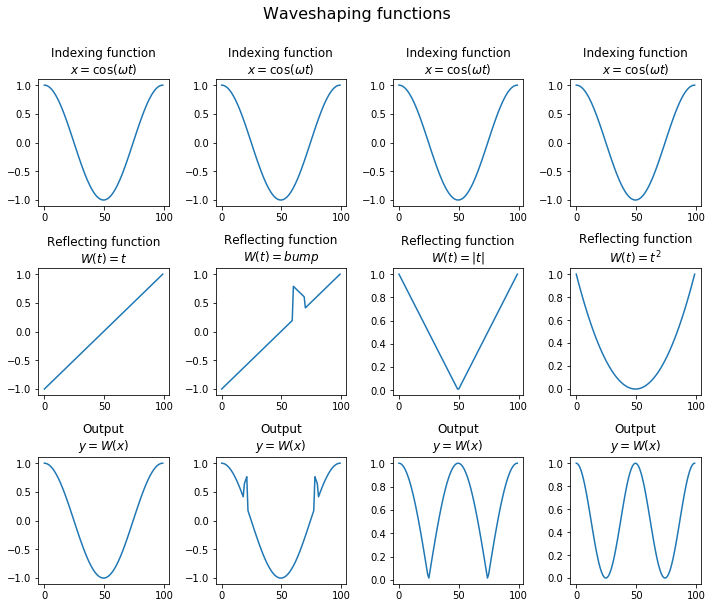

In [49]:
Ws = {
    'Reflecting function\n$W(t) = t$': lambda x: x,
    'Reflecting function\n$W(t) = bump$': lambda x: np.where((0.2 < x) & (x < 0.4), 1 - x, x),
    'Reflecting function\n$W(t) = |t|$': lambda x: np.abs(x),
    'Reflecting function\n$W(t) = t^2$': lambda x: x ** 2,
}

plot_waveshaping(np.cos(np.linspace(0, 2 * np.pi, 100)), '\cos(\omega t)', Ws)

Note that the bottom left output is a cosine with double the frequency as the input.

On _p406_, the book derives a recursive function $T_n$ that takes a sinusoidal index function like $\cos \theta$ and gives back the $n$th harmonic of $\theta$, like:

$T_n(\cos \theta) = \cos n \theta$.

The function derived is

$T_{n + 1}(x) = 2xT_n(x) - T_{n-1}(x)$.

The recursive solutions to this equation are called _Chebyshev polynomials_  of the first kind.

In [50]:
def chebyshev_polynomial(x, order):
    if order == 0:
        return np.ones(len(x))
    elif order == 1:
        return x
    else:
        return 2 * x * chebyshev_polynomial(x, order - 1) - chebyshev_polynomial(x, order - 2)

Let's see the first six Chebyshev polynomial functions and the corresponding output they produce when driven by $\cos \theta$:

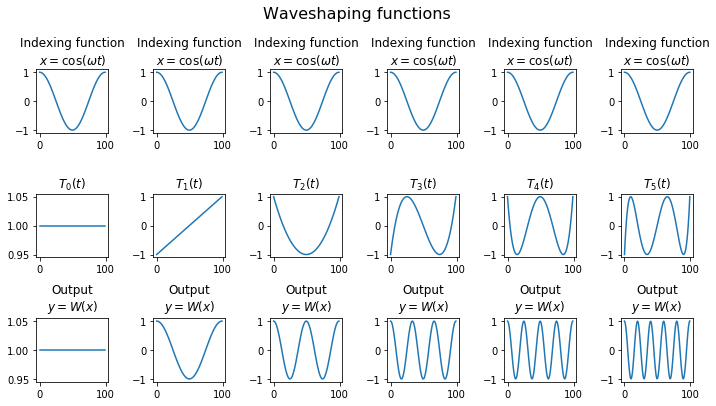

In [51]:
Ws = {
    '$T_0(t)$': lambda x: chebyshev_polynomial(x, 0),
    '$T_1(t)$': lambda x: chebyshev_polynomial(x, 1),
    '$T_2(t)$': lambda x: chebyshev_polynomial(x, 2),
    '$T_3(t)$': lambda x: chebyshev_polynomial(x, 3),
    '$T_4(t)$': lambda x: chebyshev_polynomial(x, 4),
    '$T_5(t)$': lambda x: chebyshev_polynomial(x, 5),
}

plot_waveshaping(np.cos(np.linspace(0, 2 * np.pi, 100)), '\cos(\omega t)', Ws)

Similarly to the inverse DFT, we can combine the output of these Chebyshev polynomial functions into a weighted sum of harmonics to create a waveform with an arbitrary spectrum. We could also use a different indexing function, or combinations of index functions to produce interesting waveforms.

## Vocal Synthesis

Several classical vocal synthesis techniques are described at a high level in the text.  While it's tempting to try from-scratch implementations here, it would be way too much of a time-suck.  Instead, I'll just share some random demos I found!

### Linear Predictive Coding

[LPC-10 demo](https://www.youtube.com/watch?v=yjqYmLSWvmg)

Here is the open-source [Sox LPC-10 library](https://github.com/chirlu/sox/tree/master/lpc10)

### FOF Synthesis

[MAX/MSP - Generating Human Voices/Vowels - Formant Synthesis](https://www.youtube.com/watch?v=GRAiDa7KHz8)

## Delay Lines

The following is a quick-and-dirty delay line, demonstrated with a feedback envelope that changes over time.

In [52]:
def delay_line(x, delay_length, output_length, feedback_envelope=None):
    assert feedback_envelope is None or len(feedback_envelope) == output_length

    delay_stack = np.zeros(delay_length)
    output = np.ndarray(output_length)
    for out_i in range(output.size):
        delay_i = out_i % delay_length
        delay_stack[delay_i] *= (0.5 if feedback_envelope is None else feedback_envelope[out_i])
        delay_stack[delay_i] += x[out_i % x.size]
        output[out_i] = delay_stack[delay_i]

    return output

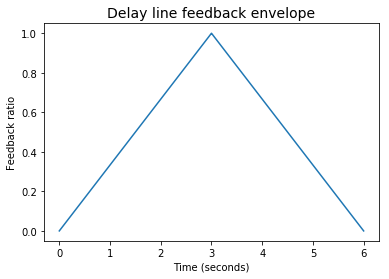

In [53]:
output_time_seconds = 6
feedback_envelope = np.hstack([np.linspace(0, 1, samps(output_time_seconds / 2)), np.linspace(1, 0, samps(output_time_seconds / 2))])
plt.title('Delay line feedback envelope', size=14)
plt.plot(np.linspace(0, output_time_seconds, samps(output_time_seconds)), feedback_envelope)
plt.xlabel('Time (seconds)')
_ = plt.ylabel('Feedback ratio')

**Dry:**

In [54]:
from scipy.io.wavfile import read as readwav
rate, samples = readwav('../amen.wav')
samples = samples.transpose()
render_samples_ipython(samples, rate=rate)

**With delay:**

In [55]:
render_samples_ipython(delay_line(samples[0,:], delay_length=samps(0.1), output_length=samps(output_time_seconds), feedback_envelope=feedback_envelope), rate=rate)

### Tapped Delay Line

The following is the exact same code as above, except that it sums multiple "tap" points (`tap_indices`) in the delay line instead of a single point.  Each tap's contribution is weighted explicitly by its corresponding entry in `tap_amps`.

In [56]:
def tapped_delay_line(x, delay_length, output_length, tap_indices=[0], tap_amps=[0.5], feedback_envelope=None):
    assert feedback_envelope is None or len(feedback_envelope) == output_length
    assert len(tap_indices) == len(tap_amps)

    delay_stack = np.zeros(delay_length)
    output = np.ndarray(output_length)
    for out_i in range(output.size):
        delay_i = out_i % delay_length
        delay_stack[delay_i] *= (0.5 if feedback_envelope is None else feedback_envelope[out_i])
        delay_stack[delay_i] += x[out_i % x.size]
        output[out_i] = np.sum(delay_stack[(delay_i + tap_indices) % delay_length] * tap_amps)

    return output

Using 16 random tap indices and amplitudes for the left and right channel separately, it's easy to hear how this general idea could be extended, with a fair amount of art and engineering on the tap indices and amplitudes, along with some artful filtering and stereo field arrangement, to create realistic sounding artificial reverberation!

In [57]:
num_taps = 16
delay_length=samps(0.5)
channels = []
for channel in range(2):
    tap_indices = np.random.randint(0, delay_length, num_taps)
    tap_amps = np.random.rand(num_taps)
    channels.append(tapped_delay_line(samples[channel,:], delay_length=delay_length, output_length=samps(output_time_seconds), tap_indices=tap_indices, tap_amps=tap_amps, feedback_envelope=feedback_envelope))
render_samples_ipython(channels, rate=rate)

## Karplus-Strong Synthesis

We can create a flexible and very inexpensive physical model of a plucked string out of a delay line.  First, remove the input $x(n)$ from the delay line. Then preload a sequence of random samples into the memory cells of the delay line.

Then we recirculate the delay line's output back to its input. The samples in the recirculating delay line form a periodic sample pattern that the ear detects as a complex tone, with a frequency $f$ corresponding to the length of the delay line and the sampling rate, $f = R / L$. Even though the pattern is random, the ear interprets it as a steady, buzzy timbre.

We can change the feedback parameter to control the decay of the recirculating delay line.

In [61]:
def ks_delay_line(delay_length, output_length, feedback=0.95):
    delay_stack = np.random.rand(delay_length) * 2 - 1
    output = np.ndarray(output_length) # could share output across multiple tones/lines
    for out_i in range(output.size):
        delay_i = out_i % delay_length
        delay_stack[delay_i] *= feedback
        output[out_i] = delay_stack[delay_i]

    return output

Let's hear a single tone with an arbitrary frequency:

In [62]:
attack_time_samples = samps(0.008)
attack_envelope = np.linspace(0, 1, attack_time_samples)
ks_tone = ks_delay_line(samps(0.01), samps(2))
ks_tone[:attack_time_samples] *= attack_envelope
render_samples_ipython(ks_tone)

Now let's mix together multiple tones with delay line lengths calculated based on frequency to create an arpeggio:

In [63]:
from pitches import frequencies_for_note_labels

frequencies = frequencies_for_note_labels(['C3', 'E3', 'G3', 'B3', 'C4', 'E4', 'G4', 'B4'])
note_output_length = samps(3.0)
note_duration = samps(0.1) 
mixed_ks_samples = np.zeros(len(frequencies) * note_duration + note_output_length - note_duration)
note_feedback = 0.98 # the higher the feedback, the longer the tail

for i, frequency in enumerate(frequencies):
    delay_length = int(SAMPLES_PER_SECOND / frequency)
    ks_tone = ks_delay_line(delay_length=delay_length, output_length=note_output_length, feedback=note_feedback)
    ks_tone[:attack_time_samples] *= attack_envelope
    mixed_ks_samples[i * note_duration:i * note_duration + note_output_length] += ks_tone

render_samples_ipython(mixed_ks_samples)

Sounds kind of like a harpsichord to me!

We could improve the realism by making higher harmonics die away more quickly than lower harmonics by replacing the feedback decay multiplier with a simple one-zero lowpass filter.

In fact, there are an enormous number ways to improve this model.  The book gets into a few, such as using an allpass filter to change the phase without changing the frequency, thus allowing arbitrary fundamental frequency.